In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('../src')

In [20]:
import anndata
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import seaborn as sns
import torch
import pandas as pd
import pyro
import spaceoracle
from spaceoracle import SpaceOracle

In [4]:
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import r2_score

In [5]:
adata_train = sc.read_h5ad('./.cache/adata_train.h5ad')
# adata_test = sc.read_h5ad('./.cache/adata_test.h5ad')

In [41]:
adata_train.shape

(10277, 4998)

In [6]:
spaceoracle.SpaceOracle.imbue_adata_with_space(
    adata=adata_train, annot='rctd_cluster', spatial_dim=64, in_place=True)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


🌍️ Generating spatial 64x64 maps...


In [10]:
import json
with open('../data/celltype_assign.json', 'r') as f:
    cell_type_mapping = json.load(f)

# Apply the mapping to the 'rctd_cluster' column
adata_train.obs['rctd_celltypes'] = adata_train.obs['rctd_cluster'].astype(str).map(cell_type_mapping)

In [11]:
from spaceoracle.models.base_estimators import BayesianRegression

In [12]:
def clean_up_adata(adata):
    fields_to_keep = ['cluster', 'rctd_cluster', 'rctd_celltypes']
    current_obs_fields = adata.obs.columns.tolist()
    excess_obs_fields = [field for field in current_obs_fields if field not in fields_to_keep]
    for field in excess_obs_fields:
        del adata.obs[field]
    
    current_var_fields = adata.var.columns.tolist()
    excess_var_fields = [field for field in current_var_fields 
        if field not in []]
    for field in excess_var_fields:
        del adata.var[field]

    del adata.uns

In [13]:
clean_up_adata(adata_train)
# clean_up_adata(adata_test)

In [14]:
del adata_train.obsm['spatial_maps']

In [15]:
from spaceoracle.models.probabilistic_estimators import ProbabilisticPixelAttention

In [17]:
from spaceoracle.models.estimators import device

spaceoracle.SpaceOracle.imbue_adata_with_space(
    adata=adata_train, annot='rctd_cluster', spatial_dim=64, in_place=True)

🌍️ Generating spatial 64x64 maps...


In [18]:
target_gene = 'Il2ra'
target_gene in adata_train.var_names

True

In [27]:
%%time
pyro.clear_param_store()

estimator = ProbabilisticPixelAttention(
    adata_train, target_gene=target_gene, layer='imputed_count')

spatial_dim = 64

estimator.fit(
    annot='rctd_cluster', 
    max_epochs=7, 
    learning_rate=7e-4, 
    spatial_dim=spatial_dim,
    batch_size=512,
    alpha=0.1
)

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/torch/storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.B

🌍️ Generating spatial 64x64 maps...


CPU times: user 18 s, sys: 3.25 s, total: 21.2 s
Wall time: 37.1 s


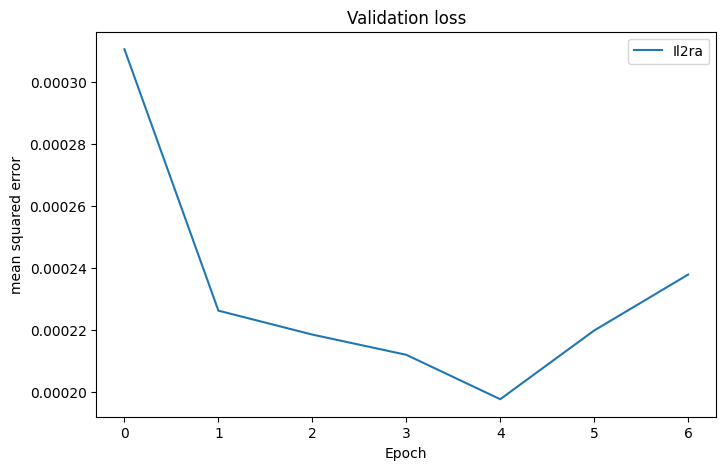

In [28]:
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams['figure.dpi'] = 100
plt.plot(estimator.losses, label=target_gene)
plt.xlabel('Epoch')
plt.ylabel('mean squared error')
plt.title(f'Validation loss')
plt.legend()
plt.show()

In [29]:
est = estimator
with torch.no_grad():
    betas_ = est.get_betas(
        spatial_maps=np.array(adata_train.obsm['spatial_maps']),
        labels=np.array(adata_train.obs['rctd_cluster']),
    )

    y_pred = est.predict_y(
        est.model, 
        torch.from_numpy(betas_).to(device), 
        torch.from_numpy(np.array(adata_train.obs['rctd_cluster'])).to(device),
        torch.from_numpy(
            adata_train.to_df(layer=est.layer)
            [est.regulators].values.astype(np.float32)).to(device)).cpu().numpy()

In [30]:
anchors = np.stack(
    [est.beta_dists[label].mean(0) for label in torch.from_numpy(np.array(adata_train.obs['rctd_cluster'])).to(device).cpu().numpy()], 
    axis=0
)
betas = betas_*anchors

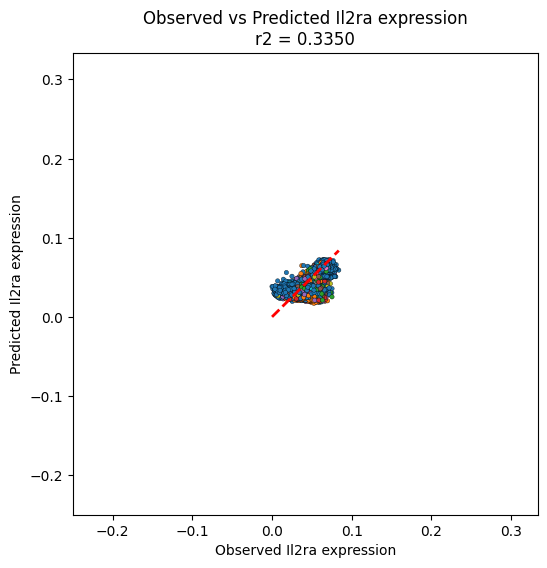

In [31]:
plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams['figure.dpi'] = 100

y = adata_train.to_df(layer=est.layer)[[target_gene]]

sns.scatterplot(
    x=y.values.reshape(-1), 
    y=y_pred.reshape(-1), s=10, 
    c=adata_train.obs.cluster.values[:], 
    cmap='tab10', 
    edgecolor='black', linewidth=0.25)

plt.xlabel(f'Observed {target_gene} expression')
plt.ylabel(f'Predicted {target_gene} expression')
plt.title(f'Observed vs Predicted {target_gene} expression\n'
    f'r2 = {r2_score(y.values.reshape(-1), y_pred.reshape(-1)):.4f}')
plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
# Add x=y line
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
plt.show()

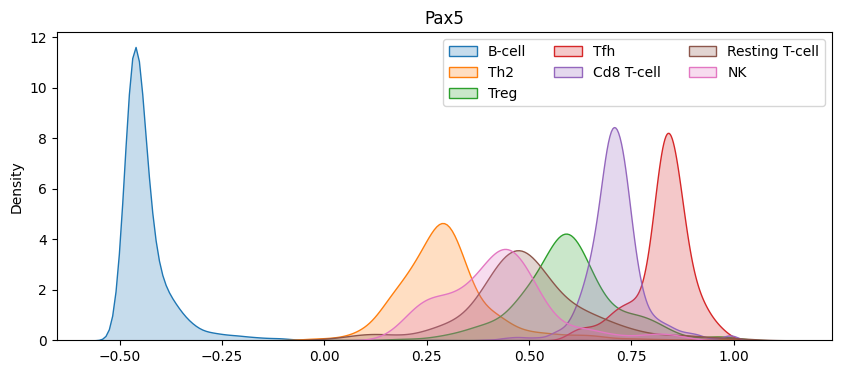

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_1317/552295250.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_1317/552295250.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_1317/552295250.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_1317/552295250.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_1317/552295250.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `w

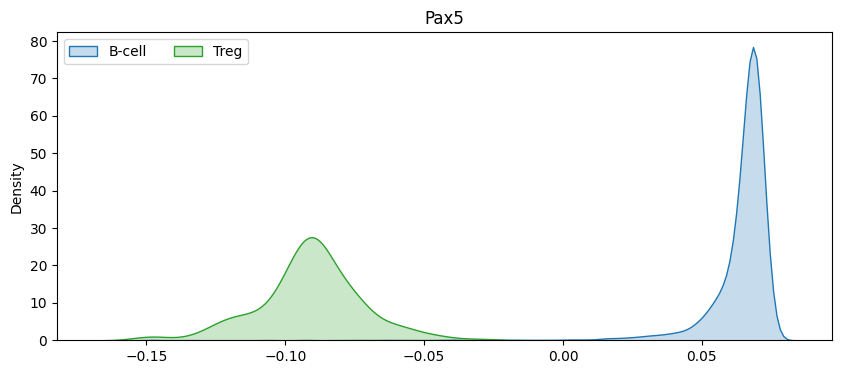

In [32]:
plt.rcParams['figure.figsize'] = [10, 4]
df = pd.DataFrame(betas_, columns=['intercept']+est.regulators)

for celltype in adata_train.obs['rctd_celltypes'].unique():
    sns.kdeplot(
        df['Pax5'].values[adata_train.obs['rctd_celltypes'] == celltype], 
        shade=True, label=celltype)
plt.title('Pax5')
plt.legend(ncols=3)
plt.show()

df = pd.DataFrame(betas, columns=['intercept']+est.regulators)

for celltype in adata_train.obs['rctd_celltypes'].unique():
    sns.kdeplot(
        df['Pax5'].values[adata_train.obs['rctd_celltypes'] == celltype], 
        shade=True, label=celltype)
plt.title('Pax5')
plt.legend(ncols=3)
plt.show()

In [33]:
estimator.is_real.sum(1).sort_values(ascending=False)

Pax5      2
Bcl11a    1
Egr1      1
Nfib      0
Zbtb6     0
Vdr       0
Taf1      0
Smad1     0
Rxra      0
Runx2     0
Nr3c1     0
Nfix      0
Nfia      0
E2f6      0
Maff      0
Klf7      0
Hivep1    0
Hdac2     0
Gtf3c2    0
Foxp3     0
Foxj3     0
Erg       0
Elf1      0
Zfp523    0
dtype: int64

In [34]:
top_=estimator.is_real.sum(1).sort_values(ascending=False).index[:18]

In [35]:
betas2 = pd.DataFrame(betas[:, 1:], columns=est.regulators)[top_].values

In [36]:
dff = pd.DataFrame(betas[:, 1:], columns=est.regulators)[top_]

In [37]:
dff

,Pax5,Bcl11a,Egr1,Nfib,Zbtb6,Vdr,Taf1,Smad1,Rxra,Runx2,Nr3c1,Nfix,Nfia,E2f6,Maff,Klf7,Hivep1,Hdac2
0,0.066144,0.040681,0.098803,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
1,0.067894,0.040239,0.100027,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
2,0.070313,0.039281,0.101776,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
3,0.000000,0.000000,-0.000000,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0
4,0.063645,0.040621,0.096118,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10272,0.066245,0.041185,0.096902,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
10273,0.000000,0.000000,-0.000000,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0
10274,0.000000,0.000000,-0.000000,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0
10275,0.054762,0.039276,0.089038,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0


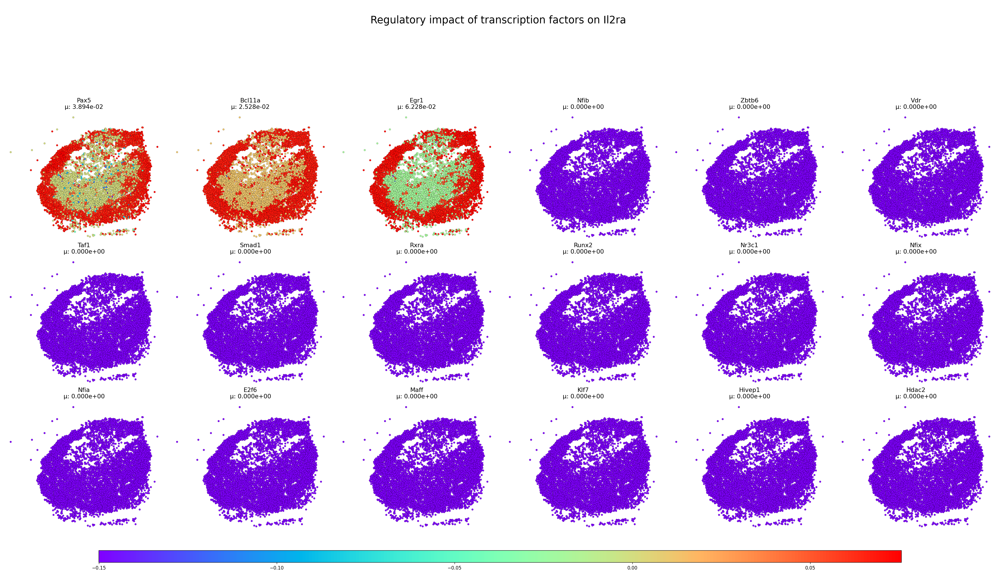

In [38]:
f, axs = plt.subplots(3, 6, figsize=(30, 18), dpi=120, sharex=True, sharey=True)
axs = axs.flatten()

scatter_plots = []

for i in range(len(axs)): 
    axs[i].set_facecolor('white')
    scatter = sns.scatterplot(x=adata_train.obsm['spatial'][:, 0], y=adata_train.obsm['spatial'][:, 1], 
                s=15, c=betas2[:, i], cmap='rainbow', 
                ax=axs[i], edgecolor='black', linewidth=0.15, 
    )
    scatter_plots.append(scatter)

beta_means = list(betas2.mean(0))
# anchor_means = list(anchors.mean(0))
for ix, ax in enumerate(axs):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    # ax.set_title(f'{top_12[ix]}')
    # ax.set_title(f'{est.regulators[ix]}\n'
    #     f'μ: {beta_means[ix+1]:.3e} | Prior: {anchor_means[ix+1]:.3e}', fontsize=13)
    ax.set_title(f'{top_[ix]}\n'
        f'μ: {beta_means[ix]:.3e}', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    
    
plt.tight_layout()
f.subplots_adjust(bottom=0.1)

# Add a colorbar
cbar_ax = f.add_axes([0.1, 0.05, 0.8, 0.02])
colorbar = f.colorbar(
    scatter_plots[0].collections[0], cax=cbar_ax, orientation='horizontal')


plt.suptitle(f'\nRegulatory impact of transcription factors on {est.target_gene} ', fontsize=22)
plt.subplots_adjust(top=0.8)
plt.show()

In [39]:
df = pd.concat(
    [est.grn.links_day3_1[ct].query('source == "Pax5" and target == "Cd74"') for ct in range(7)])[['coef_mean']]
df.index = range(7)
pid = estimator.regulators.index('Pax5')
df = df[['coef_mean']].join(pd.DataFrame({
    'so_beta_max': [betas_[adata_train.obs['rctd_cluster'] == ct][:, pid+1].max() for ct in range(7)],
    'so_beta_mean': [betas_[adata_train.obs['rctd_cluster'] == ct][:, pid+1].mean() for ct in range(7)],
    'so_beta_min': [betas_[adata_train.obs['rctd_cluster'] == ct][:, pid+1].min() for ct in range(7)]
}, index=range(7)))

df.index = df.index.map(str)
df.index = df.index.map(cell_type_mapping)

df

,coef_mean,so_beta_max,so_beta_mean,so_beta_min
B-cell,0.116651,1.000000,-0.426693,-0.510267
Cd8 T-cell,0.148926,1.000000,0.709819,0.396315
Th2,0.132956,0.999994,0.300629,-0.080043
Resting T-cell,0.075075,1.000000,0.492943,0.009084
Tfh,0.109877,0.980465,0.826558,0.595403
Treg,0.092846,0.978676,0.593328,0.189733
NK,0.057327,0.838488,0.423184,0.194688


In [40]:
df = pd.concat(
    [est.grn.links_day3_1[ct].query('source == "Pax5" and target == "Cd74"') for ct in range(7)])[['coef_mean']]
df.index = range(7)
pid = estimator.regulators.index('Pax5')
df = df[['coef_mean']].join(pd.DataFrame({
    'so_beta_max': [betas[adata_train.obs['rctd_cluster'] == ct][:, pid+1].max() for ct in range(7)],
    'so_beta_mean': [betas[adata_train.obs['rctd_cluster'] == ct][:, pid+1].mean() for ct in range(7)],
    'so_beta_min': [betas[adata_train.obs['rctd_cluster'] == ct][:, pid+1].min() for ct in range(7)]
}, index=range(7)))

df.index = df.index.map(str)
df.index = df.index.map(cell_type_mapping)

df

,coef_mean,so_beta_max,so_beta_mean,so_beta_min
B-cell,0.116651,0.075612,0.063228,-0.148182
Cd8 T-cell,0.148926,0.000000,0.000000,0.000000
Th2,0.132956,0.000000,0.000000,-0.000000
Resting T-cell,0.075075,0.000000,0.000000,0.000000
Tfh,0.109877,0.000000,0.000000,0.000000
Treg,0.092846,-0.029095,-0.090984,-0.150075
NK,0.057327,0.000000,0.000000,0.000000


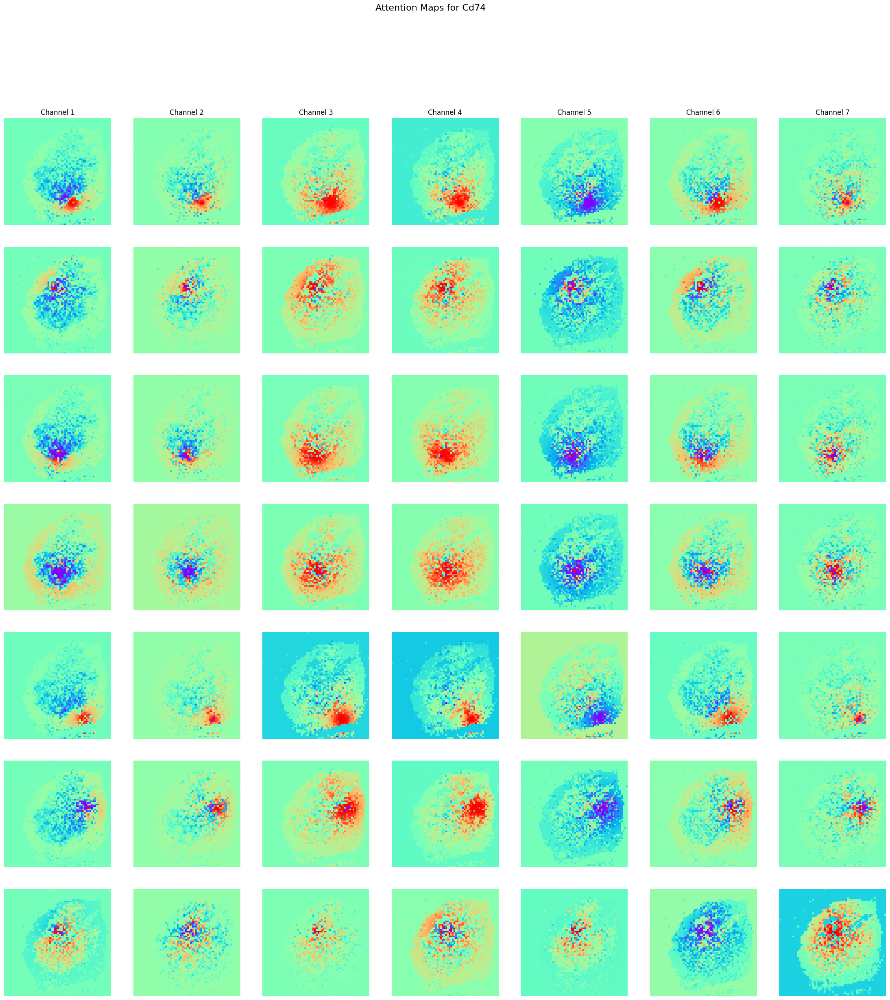

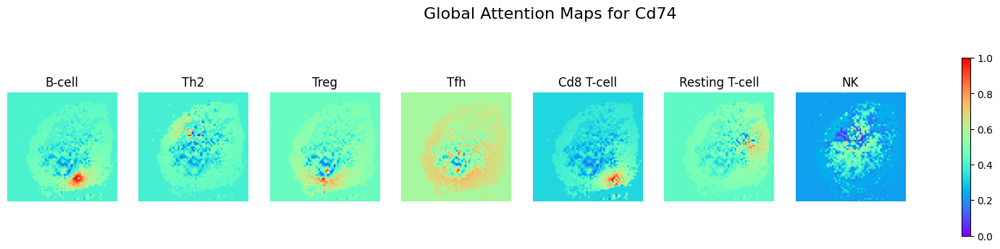

In [682]:
# Assuming the model is stored in est.model
model = estimator.model
model.eval()
# Get a batch of spatial maps and cluster info
_unique_adata = adata_train[adata_train.obs.drop_duplicates(subset=['rctd_cluster']).index].copy()
spatial_maps = torch.from_numpy(_unique_adata.obsm['spatial_maps']).float()  # Take first 5 samples
cluster_info = torch.from_numpy(np.array(_unique_adata.obs['rctd_cluster'])).long()
cluster_labels = np.array(_unique_adata.obs['rctd_celltypes'])

# Move tensors to the same device as the model
device = next(model.parameters()).device
spatial_maps = spatial_maps.to(device)
cluster_info = cluster_info.to(device)

# Get the attention maps
with torch.no_grad():
    att = model.sigmoid(model.conditional_conv(spatial_maps, cluster_info))

# Move attention maps back to CPU for plotting
att = att.cpu().numpy()

# att = att * spatial_maps.cpu().numpy()

# att = att * mask
# Plot 3 examples of attention maps
n_examples = 7
n_channels = att.shape[1]

fig, axes = plt.subplots(n_examples, n_channels, figsize=(4*n_channels, 4*n_examples))
fig.suptitle(f'Attention Maps for {target_gene}', fontsize=16)

for i in range(n_examples):
    for j in range(n_channels):
        im = axes[i, j].imshow(att[i, j], cmap='rainbow')
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(f'Channel {j+1}')
    # axes[i, 0].set_ylabel(f'Example {i+1}', rotation=0, ha='right', va='center')

# fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.5, orientation='horizontal')

# plt.tight_layout()
plt.show()

# Calculate the mean attention across channels
mean_att = att.sum(1)

# Plot the mean attention maps
fig, axes = plt.subplots(1, 7, figsize=(20, 4))
fig.suptitle(f'Global Attention Maps for {target_gene}', fontsize=16)
for i in range(7):
    # Normalize the data to have a minimum value of 0
    normalized_att = (mean_att[i] - mean_att[i].min()) / (mean_att[i].max() - mean_att[i].min())
    im = axes[i].imshow(normalized_att, cmap='rainbow', vmin=0)
    axes[i].axis('off')
    axes[i].set_title(f'{cluster_labels[i]}')

plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8)
# plt.tight_layout()
plt.show()


In [305]:
cluster_info

tensor([0, 2, 5, 4, 1, 3, 6], device='mps:0')

In [306]:
from scipy.ndimage import gaussian_filter

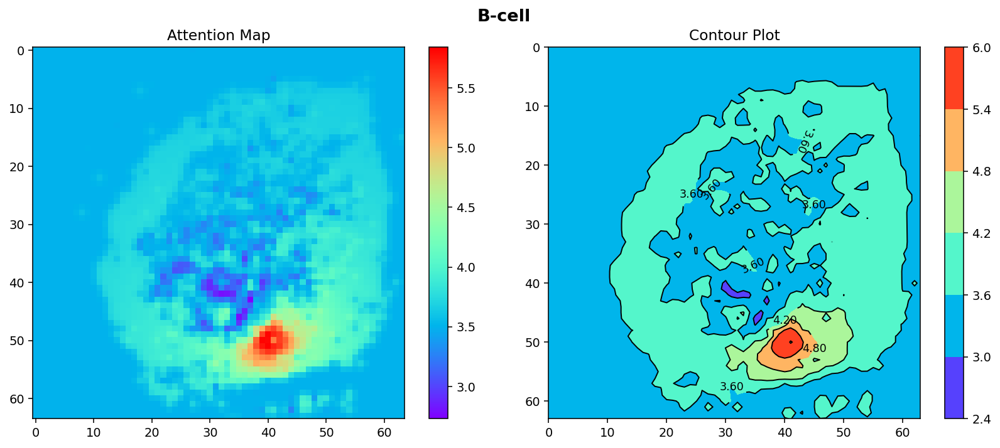

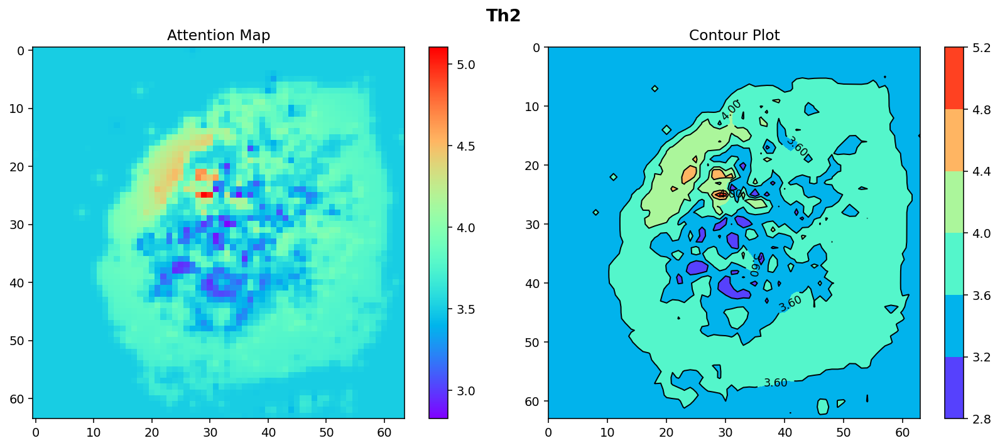

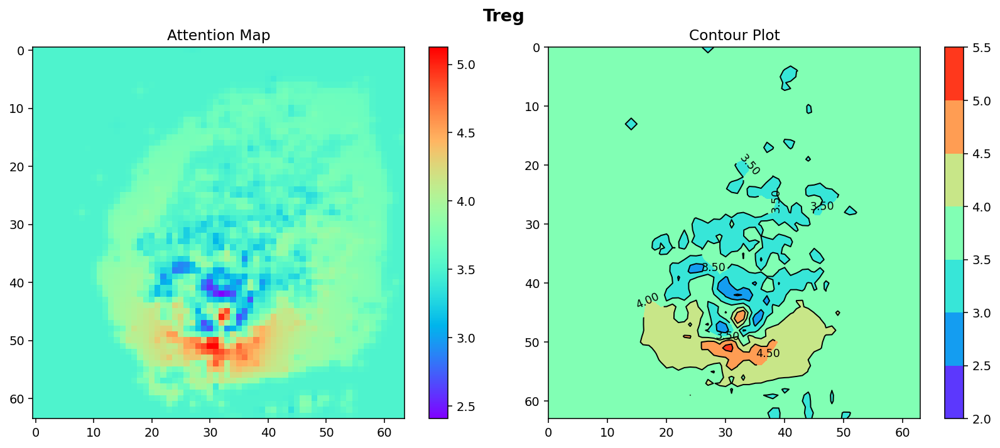

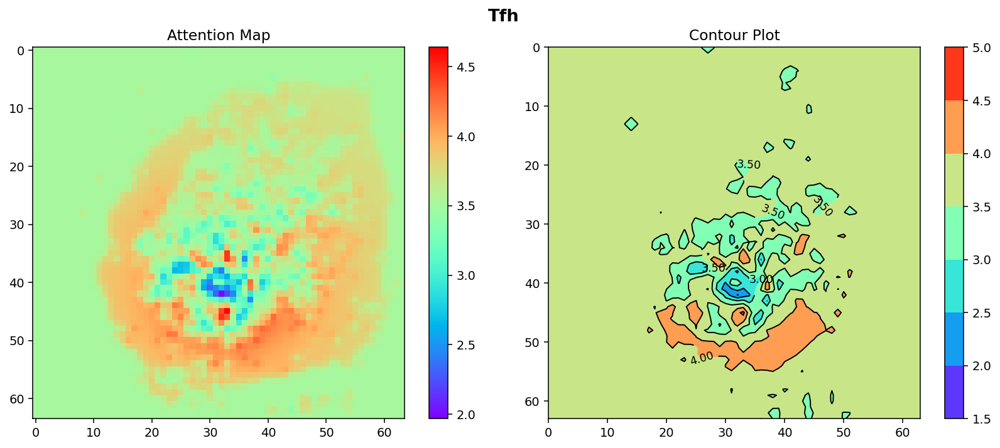

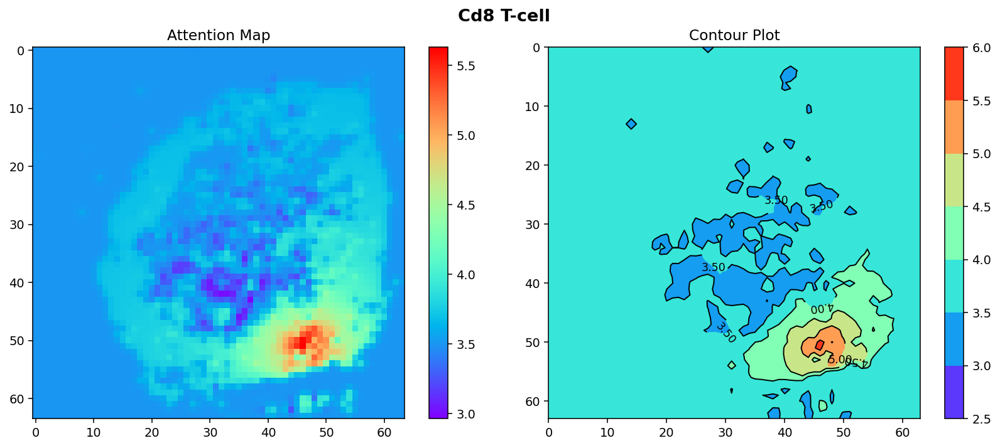

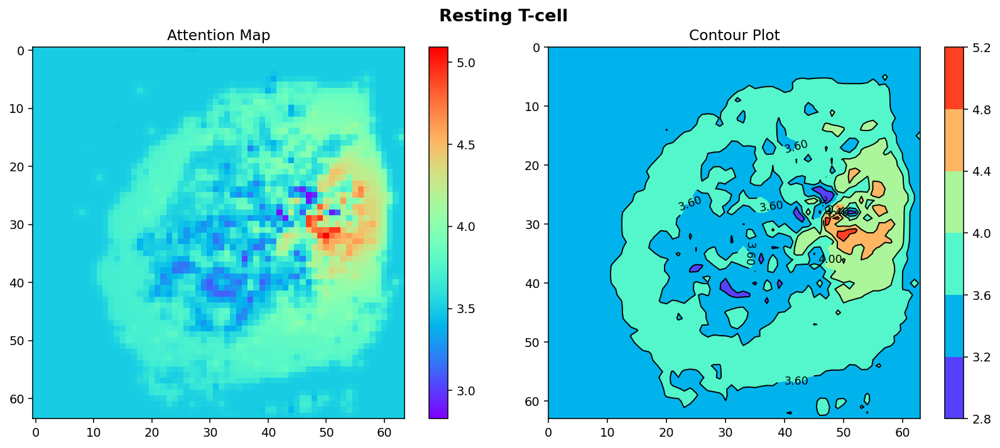

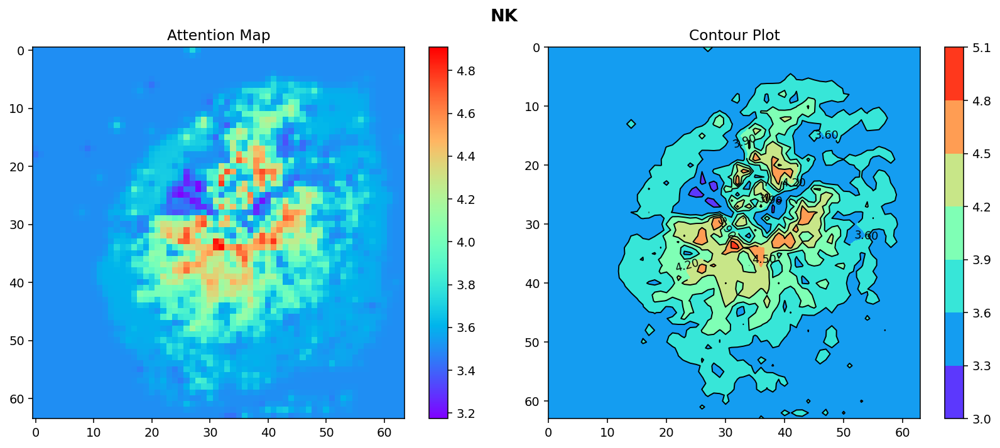

In [324]:
for sample_id in range(7):
    atx = att.sum(1)[sample_id]

    atx = gaussian_filter(atx, sigma=0.6)

    # atx = atx * mask.sum(1)[sample_id]


    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharex=False, sharey=False, dpi=140)
    plt.suptitle(
        f'{cluster_labels[sample_id]}', fontsize=14, fontweight='bold')
    levels = 5

    # Image plot
    im1 = ax1.imshow(atx, cmap='rainbow')
    ax1.set_title('Attention Map')
    fig.colorbar(im1, ax=ax1)

    # Contour plot
    x = np.arange(0, atx.shape[1])
    y = np.arange(0, atx.shape[0])
    X, Y = np.meshgrid(x, y)
    im2 = ax2.contourf(Y, X, atx.T, cmap='rainbow', levels=levels)  # Transpose att and swap X, Y
    contour = ax2.contour(Y, X, atx.T, levels=levels, colors='black', linewidths=1)  # Add black lines around contours
    ax2.set_title('Contour Plot')
    fig.colorbar(im2, ax=ax2)

    # Add contour labels with black color and rotate to align with contour lines
    ax2.clabel(contour, inline=True, fontsize=9, colors='black', fmt='%1.2f', use_clabeltext=True)
    for l in contour.labelTexts:
        l.set_rotation_mode('anchor')
        l.set_rotation(0)  # This will be adjusted in the loop below

    # Adjust label rotation to align with contour lines
    for i, line in enumerate(contour.collections):
        for j, path in enumerate(line.get_paths()):
            vertices = path.vertices
            x = vertices[:, 0]
            y = vertices[:, 1]
            # Calculate the angle of the contour line
            angle = np.rad2deg(np.arctan2(y[-1] - y[0], x[-1] - x[0]))
            # Adjust the rotation of the corresponding label
            if i < len(contour.labelTexts):
                contour.labelTexts[i].set_rotation(angle)

    ax2.set_aspect('equal')
    ax2.invert_yaxis()  # Invert y-axis to match image orientation

    plt.tight_layout()
    plt.show()

In [216]:
celltype_assign = {
    0: 'B-cell',
    1: 'Cd8 T-cell', 
    2: 'NK',
    3: 'Resting T-cell',
    4: 'Tfh',
    5: 'Th2',
    6: 'Treg'
}
print(celltype_assign)

{0: 'B-cell', 1: 'Cd8 T-cell', 2: 'NK', 3: 'Resting T-cell', 4: 'Tfh', 5: 'Th2', 6: 'Treg'}


In [217]:
# plt.rcParams['figure.figsize'] = (16, 20)  # Increased figure size for multiple subplots
# fig, axes = plt.subplots(4, 2, figsize=(16, 20))  # 4x2 grid of subplots

# spatial_info = adata_train.obsm['spatial_maps']

# for idx, (cell_type_idx, cell_type_name) in enumerate(celltype_assign.items()):
#     row = idx // 2
#     col = idx % 2
    
#     dist = spatial_info[sample_id][int(cell_type_idx)].flatten()
#     attention = att[sample_id][int(cell_type_idx)].flatten()
    
#     sns.scatterplot(
#         y=attention[dist > 0],
#         x=dist[dist > 0].max() / (spatial_info[sample_id][int(cell_type_idx)].flatten())[dist > 0],
#         ax=axes[row, col]
#     )
    
#     axes[row, col].set_xlabel(f'Distance from {cell_type_name}')
#     axes[row, col].set_ylabel('Attention Score')
#     axes[row, col].set_title(f'{cell_type_name}')

# plt.tight_layout()
# plt.show()

In [218]:
with torch.no_grad():
    betas_test = est.get_betas(
        spatial_maps=np.array(adata_test.obsm['spatial_maps']),
        labels=np.array(adata_test.obs['rctd_cluster']),
    )
    
    y_pred_test = est.predict_y(
        est.model, 
        torch.from_numpy(betas_test).to(device), 
        torch.from_numpy(
            adata_test.to_df(est.layer)
            [est.regulators].values.astype(np.float32)).to(device)).cpu().numpy()

NameError: name 'adata_test' is not defined

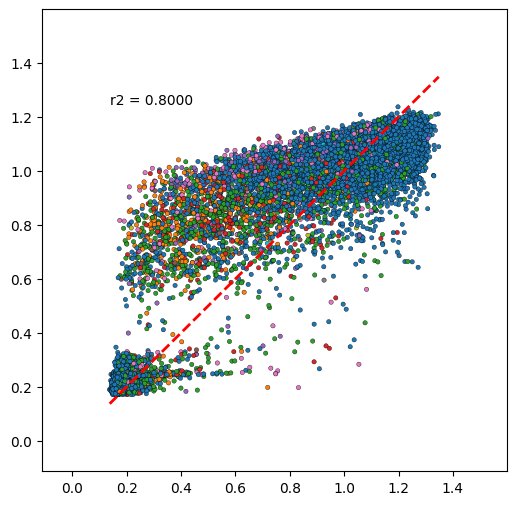

In [47]:
plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams['figure.dpi'] = 100
y = adata_test.to_df(layer=est.layer)[[target_gene]]
sns.scatterplot(
    x=y.values.reshape(-1), 
    y=y_pred_test.reshape(-1), s=10, 
    c=adata_test.obs.cluster.values[:], cmap='tab10', edgecolor='black', linewidth=0.25)
plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)

r2 = r2_score(y.values.reshape(-1), y_pred_test.reshape(-1))
plt.text(
    x=y.values.min(), 
    y=y_pred_test.max()+0.05, 
    s=f'r2 = {r2:.4f}', 
    fontsize=10, 
    fontname='DejaVu Sans',
    ha='left',
    va='top'
)
plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
plt.show()


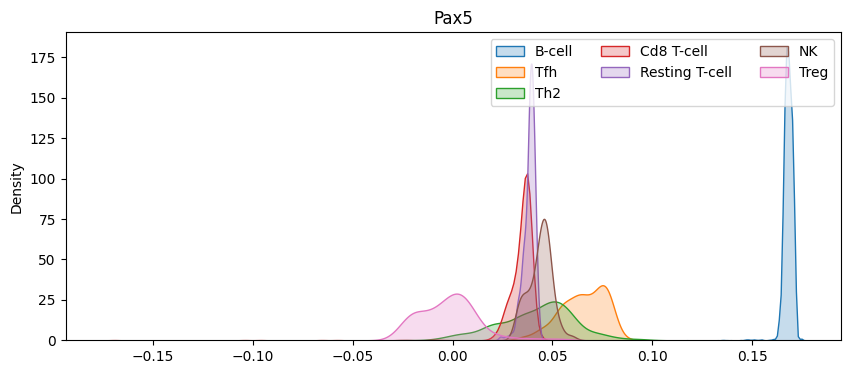

In [48]:
plt.rcParams['figure.figsize'] = [10, 4]
df = pd.DataFrame(betas_test, columns=['intercept']+est.regulators)

for celltype in adata_test.obs['rctd_celltypes'].unique():
    sns.kdeplot(
        df['Pax5'].values[adata_test.obs['rctd_celltypes'] == celltype], 
        shade=True, label=celltype)

plt.title('Pax5')
plt.legend(ncols=3)
plt.show()

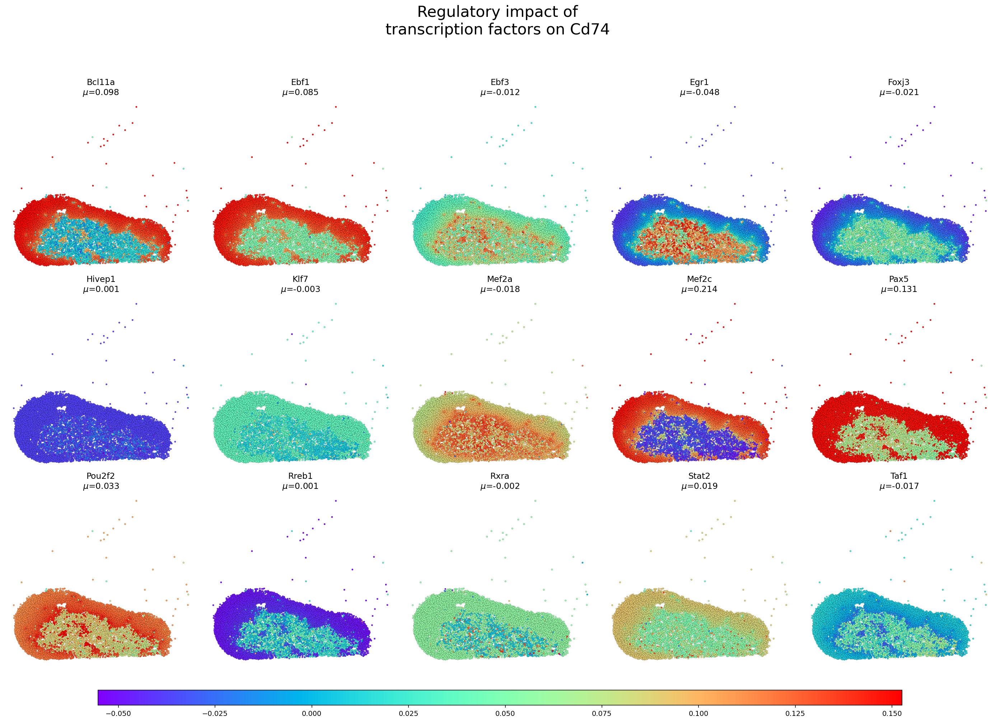

In [49]:
f, axs = plt.subplots(3, 5, figsize=(20, 15), dpi=140, sharex=True, sharey=True)
axs = axs.flatten()

scatter_plots = []

for i in range(len(axs)): 
    axs[i].set_facecolor('white')
    scatter = sns.scatterplot(x=adata_test.obsm['spatial'][:, 0], y=adata_test.obsm['spatial'][:, 1], 
                s=5, c=betas_test[:, i+1], cmap='rainbow', 
                ax=axs[i], edgecolor='black', linewidth=0.1, 
    )
    scatter_plots.append(scatter)

beta_means = list(betas_test.mean(0))
for ix, ax in enumerate(axs):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(f'{est.regulators[ix]}\n'+ r'$\mu$' + f'={beta_means[ix+1]:.3f}')
    ax.set_xticks([])
    ax.set_yticks([])
    
    
plt.tight_layout()
f.subplots_adjust(bottom=0.1)

# Add a colorbar
cbar_ax = f.add_axes([0.1, 0.05, 0.8, 0.02])
colorbar = f.colorbar(
    scatter_plots[0].collections[0], cax=cbar_ax, orientation='horizontal')


plt.suptitle(f'Regulatory impact of \ntranscription factors on {est.target_gene} ', fontsize=22)
plt.subplots_adjust(top=0.855)
plt.show()

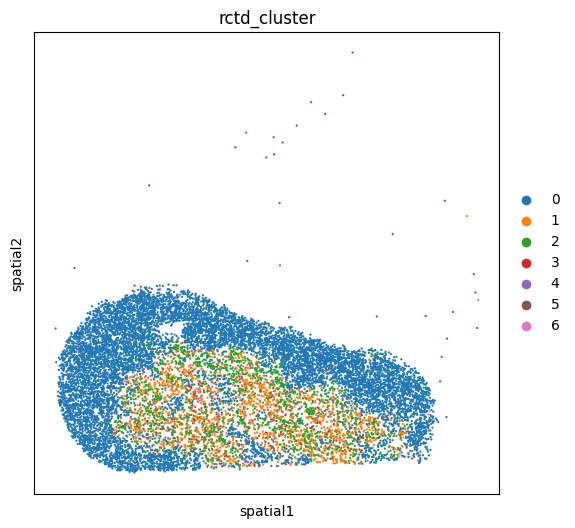

In [52]:
sc.pl.embedding(adata_test, color='rctd_cluster', basis='spatial', layer='imputed_count', cmap='viridis')

In [231]:
adata_x = sc.read_h5ad('../data/slideseq/day3_1.h5ad')
adata_x

AnnData object with n_obs × n_vars = 15920 × 24649
    obs: 'cluster', 'rctd_cluster'
    uns: 'cluster_colors', 'rctd_cluster_colors'
    obsm: 'X_spatial', 'rctd_results', 'spatial'

In [256]:
[gene for gene in adata_x.var_names if 'Prdm' in gene]

['Prdm1',
 'Prdm10',
 'Prdm11',
 'Prdm15',
 'Prdm16',
 'Prdm2',
 'Prdm4',
 'Prdm5',
 'Prdm8',
 'Prdm9']

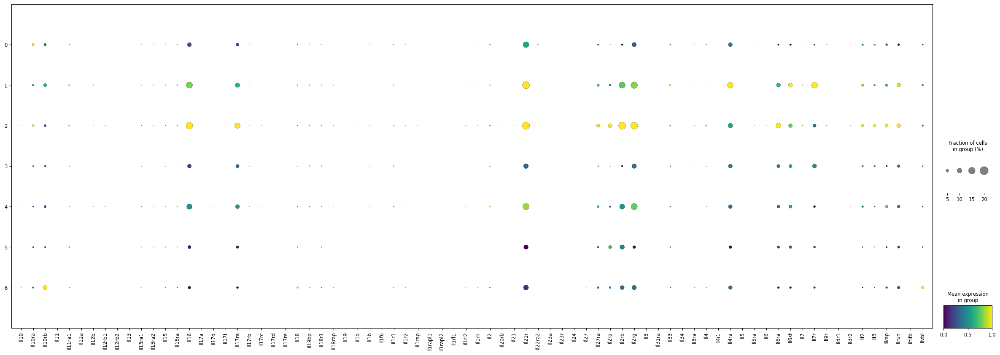

In [249]:
genes_of_interest = sorted([gene for gene in adata_x.var_names if 'Il' in gene])
sc.pl.dotplot(
    adata_x, 
    var_names=genes_of_interest, 
    groupby='rctd_cluster', 
    cmap='viridis', 
    standard_scale='var', 
    color_map='viridis',
    figsize=(30, 10),
)


In [273]:

n_top_genes = 10000
min_cells = 10
min_counts = 350
spatial_dim = 64

adata_x = anndata.read_h5ad('../data/slideseq/day3_1.h5ad')

adata_x.var_names_make_unique()
adata_x.var["mt"] = adata_x.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata_x, qc_vars=["mt"], inplace=True)
sc.pp.filter_cells(adata_x, min_counts=min_counts)
adata_x = adata_x[adata_x.obs["pct_counts_mt"] < 20].copy()
adata_x = adata_x[:, ~adata_x.var["mt"]]
sc.pp.filter_genes(adata_x, min_cells=min_cells)

adata_x.layers["raw_count"] = adata_x.X

sc.pp.normalize_total(adata_x, inplace=True)
sc.pp.log1p(adata_x)
sc.pp.highly_variable_genes(
    adata_x, flavor="seurat", n_top_genes=n_top_genes)

adata_x = adata_x[:, adata_x.var.highly_variable]

In [274]:
assert all(gene in adata_x.var_names for gene in ['Il2', 'Il4', 'Il12b', 'Prdm1'])

In [275]:
adata_x.layers['normalized_count'] = adata_x.X

In [276]:
%%time

from spaceoracle.oracles import SpaceOracle

pcs = SpaceOracle.perform_PCA(adata_x)
SpaceOracle.knn_imputation(adata_x, pcs)


CPU times: user 50min 53s, sys: 32.3 s, total: 51min 25s
Wall time: 6min 32s


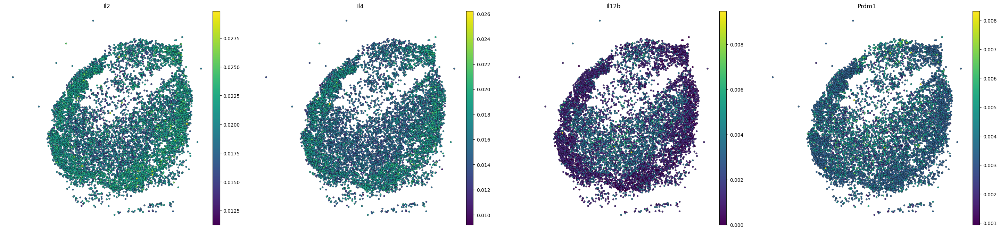

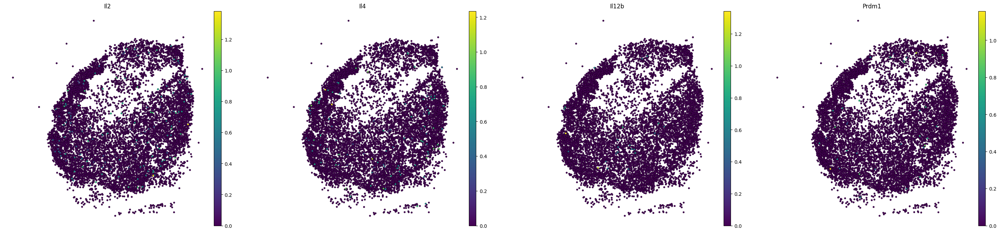

In [280]:
plt.rcParams['figure.figsize'] = [8, 8]
sc.pl.embedding(
    adata_x, 
    color=['Il2', 'Il4', 'Il12b', 'Prdm1'], 
    basis='spatial', 
    layer='imputed_count', 
    cmap='viridis',
    frameon=False,
    show=True,
    s=50, linewidth=0.25, edgecolor='black'
)

sc.pl.embedding(
    adata_x, 
    color=['Il2', 'Il4', 'Il12b', 'Prdm1'], 
    basis='spatial', 
    layer='normalized_count', 
    cmap='viridis',
    frameon=False,
    show=True,
    s=50, linewidth=0.25, edgecolor='black'
)